# Predicting IMDB Rating on Movies

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import datetime
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import scipy.stats as stats


%config InlineBackend.figure_formats = ['svg']
%matplotlib inline

sns.set(context = 'notebook', style='whitegrid', font_scale = 0.8)

## Data Cleaning

In [2]:
imdb = pd.read_csv('imdb_movies.csv')

In [3]:
imdb.head()

,Title,IMDB Rating,Genre,Content Rating,Director,Stars,Release Year,Domestic Gross Earnings,Runtime,Votes,Metascore
0,The Shawshank Redemption,9.3,Drama,R,Frank Darabont,"Tim Robbins, Morgan Freeman, Bob Gunton, Willi...",1994,28.34,142,2415857,80.0
1,The Dark Knight,9.0,"Action, Crime, Drama",PG-13,Christopher Nolan,"Christian Bale, Heath Ledger, Aaron Eckhart, M...",2008,534.86,152,2373685,84.0
2,Inception,8.8,"Action, Adventure, Sci-Fi",PG-13,Christopher Nolan,"Leonardo DiCaprio, Joseph Gordon-Levitt, Ellio...",2010,292.58,148,2130530,74.0
3,Fight Club,8.8,Drama,R,David Fincher,"Brad Pitt, Edward Norton, Meat Loaf, Zach Grenier",1999,37.03,139,1905786,66.0
4,Pulp Fiction,8.9,"Crime, Drama",R,Quentin Tarantino,"John Travolta, Uma Thurman, Samuel L. Jackson,...",1994,107.93,154,1875061,94.0


In [4]:
imdb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Title                    3000 non-null   object 
 1   IMDB Rating              3000 non-null   float64
 2   Genre                    3000 non-null   object 
 3   Content Rating           2930 non-null   object 
 4   Director                 3000 non-null   object 
 5   Stars                    3000 non-null   object 
 6   Release Year             2999 non-null   object 
 7   Domestic Gross Earnings  2843 non-null   float64
 8   Runtime                  3000 non-null   int64  
 9   Votes                    3000 non-null   int64  
 10  Metascore                2919 non-null   float64
dtypes: float64(3), int64(2), object(6)
memory usage: 257.9+ KB


In [5]:
imdb.describe()

,IMDB Rating,Domestic Gross Earnings,Runtime,Votes,Metascore
count,3000.000000,2843.000000,3000.000000,3.000000e+03,2919.000000
mean,6.878800,75.615596,113.608667,2.080145e+05,60.117506
std,0.879747,87.565533,21.043807,2.203653e+05,17.179122
min,1.100000,0.000000,64.000000,5.870900e+04,9.000000
25%,6.300000,21.155000,99.000000,8.457125e+04,48.000000
50%,6.900000,49.880000,110.000000,1.290600e+05,60.000000
75%,7.500000,100.325000,124.000000,2.353035e+05,73.000000
max,9.300000,936.660000,321.000000,2.415857e+06,100.000000


In [6]:
imdb.drop_duplicates('Title', inplace=True)

In [7]:
imdb.shape[0]

2952

In [8]:
imdb.dropna(subset = ['Domestic Gross Earnings'], inplace=True)

In [9]:
imdb['Metascore'].fillna(imdb['Metascore'].mean(), inplace=True)

In [10]:
imdb[imdb['Domestic Gross Earnings'] == 0]

,Title,IMDB Rating,Genre,Content Rating,Director,Stars,Release Year,Domestic Gross Earnings,Runtime,Votes,Metascore
822,Mr. Nobody,7.8,"Drama, Fantasy, Romance",R,Jaco Van Dormael,"Jared Leto, Sarah Polley, Diane Kruger, Linh D...",2009,0.0,141,221171,63.0


With a quick google, 'Mr.Nobody' is an international film. According to `boxofficemojo`, it has a worldwide revenue of 3.5 million however just 3,600 in domestic revenue. I will drop this movie since it seems misleading. 

In [11]:
imdb.drop(822,inplace=True)

In [12]:
imdb[imdb['Release Year'].isnull()]

,Title,IMDB Rating,Genre,Content Rating,Director,Stars,Release Year,Domestic Gross Earnings,Runtime,Votes,Metascore
1354,Snowden,7.3,"Biography, Crime, Drama",R,Oliver Stone,"Joseph Gordon-Levitt, Shailene Woodley, Meliss...",NaN,21.59,134,142641,58.0


In [13]:
imdb.loc[1354, 'Release Year'] = '2016'

In [14]:
imdb['Release Year'] = imdb['Release Year'].str.replace('V','').str.strip()

In [15]:
imdb['Release Year'] =  imdb['Release Year'].astype('int64')

## Baseline Analysis

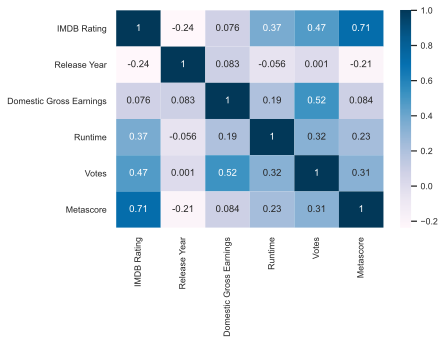

In [16]:
sns.heatmap(imdb.corr(), cmap='PuBu', annot=True);

In [17]:
sns.pairplot(imdb, height = 1.2, aspect = 1.25);

Testing out a couple of numerical features.

In [18]:
X,y = imdb[['Metascore']], imdb['IMDB Rating']

In [19]:
lr = LinearRegression()
lr.fit(X,y)
print('R-squared: {}'.format(lr.score(X,y)))

R-squared: 0.50885857369564


In [20]:
lr.intercept_ 

4.739392296933923

In [21]:
lr.coef_

array([0.03570593])

Checking for multicollinearity.

In [22]:
def vif(df_X):
    vif_data = [variance_inflation_factor(df_X.values, i) for i in range(df_X.shape[1])]
    return pd.Series(vif_data, index=df_X.columns)

In [23]:
vif(imdb[['Runtime', 'Votes', 'Metascore','Domestic Gross Earnings','Release Year']])


Runtime                    35.608933
Votes                       3.024844
Metascore                  15.171960
Domestic Gross Earnings     2.429282
Release Year               38.780034
dtype: float64

In [24]:
vif(imdb[['Runtime', 'Votes', 'Metascore','Domestic Gross Earnings']])


Runtime                    12.708467
Votes                       2.836687
Metascore                  12.504424
Domestic Gross Earnings     2.411530
dtype: float64

## Feature Engineering

In [25]:
imdb.set_index('Title',inplace=True)

In [26]:
imdb_cp = imdb.copy()

#### Numeric Features

In [27]:
X,y = imdb_cp[['Runtime','Votes','Metascore', 'Domestic Gross Earnings']], imdb_cp['IMDB Rating']

In [28]:
lr = LinearRegression()
lr.fit(X,y)
print('R-squared: {}'.format(lr.score(X,y)))

R-squared: 0.6160636352383044


##### Years since Release
Instead of doing the release year, taking how many years have passed since the release of the movie could be a better feature.

In [29]:
year = datetime.datetime.today().year
imdb_cp['Age'] = imdb_cp['Release Year'].apply(lambda x: year -  x)

In [30]:
X,y = imdb_cp.iloc[:,6:], imdb_cp['IMDB Rating']

In [31]:
lr = LinearRegression()
lr.fit(X, y)
print('R-squared: {}'.format(lr.score(X, y)))

R-squared: 0.6248886028409897


#### Content Rating Dummies

In [32]:
imdb_cp = pd.get_dummies(imdb_cp, columns=['Content Rating'])

In [33]:
X,y = imdb_cp.iloc[:,6:], imdb_cp['IMDB Rating']

In [34]:
lr = LinearRegression()
lr.fit(X,y)
print('R-squared : {}'.format(lr.score(X,y)))

R-squared : 0.6250344983294054


#### Genre Dummies

In [35]:
genre_dummies = imdb_cp['Genre'].str.get_dummies(sep=', ').rename(lambda x: 'Genre_' + x, axis='columns')

In [36]:
genre_dummies.sum().sort_values(ascending=False)

Genre_Drama          1327
Genre_Comedy          967
Genre_Action          952
Genre_Adventure       739
Genre_Crime           550
Genre_Thriller        522
Genre_Romance         371
Genre_Sci-Fi          316
Genre_Fantasy         286
Genre_Mystery         283
Genre_Horror          276
Genre_Biography       197
Genre_Animation       175
Genre_Family          152
Genre_History          79
Genre_Music            61
Genre_Sport            61
Genre_War              36
Genre_Musical          26
Genre_Western          17
Genre_Documentary      13
Genre_News              1
dtype: int64

In [37]:
imdb_cp = pd.concat([imdb_cp, genre_dummies], axis=1)

In [38]:
X,y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']

In [39]:
lr = LinearRegression()
lr.fit(X,y)
print('R-squared : {}'.format(lr.score(X,y)))

R-squared : 0.6679158254317872


#### Director Dummies

Extract top directors.

In [40]:
director_dummies = pd.get_dummies(imdb_cp['Director'])

In [41]:
dir_20 = imdb_cp['Director'].value_counts()[:20].index.tolist()

In [42]:
imdb_cp = pd.concat([imdb_cp, director_dummies[dir_20]], axis=1)

In [43]:
X,y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']

In [44]:
lr = LinearRegression()
lr.fit(X,y)
print('R-squared : {}'.format(lr.score(X,y)))

R-squared : 0.6734930021663426


## Training and Validating

##### Linear vs Polynomial

In [45]:
X, y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.2, random_state=20)

In [46]:
poly = PolynomialFeatures(degree=2) 

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)

lr_poly = LinearRegression()

In [47]:
lr.fit(X_train, y_train)
print(f'Linear Regression train R-squared: {lr.score(X_train, y_train)}')
print(f'Linear Regression val R-squared: {lr.score(X_val, y_val)}')


lr_poly.fit(X_train_poly, y_train)
print(f'Degree 2 Polynomial Regression train R-squared: {lr_poly.score(X_train_poly, y_train)}')
print(f'Degree 2 Polynomial regression val R-squared: {lr_poly.score(X_val_poly, y_val)}')

Linear Regression train R-squared: 0.6891467861185934
Linear Regression val R-squared: 0.5971408320619098
Degree 2 Polynomial Regression train R-squared: 0.8217873089888208
Degree 2 Polynomial regression val R-squared: 0.4545972728797921


##### Linear vs Ridge

In [48]:
X, y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']
X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=20)

In [49]:
X, y = np.array(X), np.array(y)

In [50]:
kf = KFold(n_splits=5, shuffle=True, random_state = 20)
cv_lr_r2s, cv_lr_reg_r2s = [], []

for train_ind, val_ind in kf.split(X,y):
    
    X_train, y_train = X[train_ind], y[train_ind]
    X_val, y_val = X[val_ind], y[val_ind] 
    
    #Linear Regression
    lr = LinearRegression()
    lr_reg = Ridge(alpha=0.01)

    lr.fit(X_train, y_train)
    cv_lr_r2s.append(lr.score(X_val, y_val))
    
    #Ridge
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    
    lr_reg.fit(X_train_scaled, y_train)
    cv_lr_reg_r2s.append(lr_reg.score(X_val_scaled, y_val))

print('Simple regression scores: ', cv_lr_r2s)
print('Ridge scores: ', cv_lr_reg_r2s, '\n')

print(f'Simple mean cv R-squared: {np.mean(cv_lr_r2s)} +- {np.std(cv_lr_r2s)}')
print(f'Ridge mean cv R-squared: {np.mean(cv_lr_reg_r2s)} +- {np.std(cv_lr_reg_r2s)}')

Simple regression scores:  [0.6480404268861308, 0.6509573126800243, 0.6866378767302719, 0.6913706581494389, 0.6616440171410504]
Ridge scores:  [0.6480393370940958, 0.6509577780287558, 0.6866375641891125, 0.6913723381172923, 0.6616463958080725] 

Simple mean cv R-squared: 0.6677300583173833 +- 0.018013495145963673
Ridge mean cv R-squared: 0.6677306826474657 +- 0.018013861376053826


## Testing

In [51]:
#Mean Absolute Error (MAE)
def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)) 

In [52]:
#Ridge
X, y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=20)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

lm_rid = Ridge()
kf = KFold(n_splits=5, shuffle=True, random_state = 20)
cross_val_score(lm_rid, X_train_scaled, y_train, cv=kf, scoring='r2')

lm_rid.fit(X_train_scaled,y_train)
print('Ridge R-squared Training:{:.5f}'.format(lm_rid.score(X_train_scaled, y_train)))
print('Ridge R-squared: {:.5f}'.format(lm_rid.score(X_test_scaled, y_test)))

m_alpha = RidgeCV(alphas=[0.1, 1.0, 10.0])
model_cv = m_alpha.fit(X_train_scaled, y_train)
print('Ideal Alpha: {}'.format(model_cv.alpha_))

ridge_10 = Ridge(alpha=10)
ridge_10.fit(X_train_scaled,y_train)
print('With Alpha = 10.0')
print('Ridge R-squared Training:{:.5f}'.format(ridge_10.score(X_train_scaled, y_train)))
print('Ridge R-squared: {:.5f}'.format(ridge_10.score(X_test_scaled, y_test)))

model_pred = ridge_10.predict(X_test_scaled)

print('Ridge MAE {:.5f}'.format(mae(model_pred, y_test)))

Ridge R-squared Training:0.68914
Ridge R-squared: 0.60748
Ideal Alpha: 10.0
With Alpha = 10.0
Ridge R-squared Training:0.68900
Ridge R-squared: 0.60759
Ridge MAE 0.38604


In [53]:
test_set_pred = lm_rid.predict(X_test_scaled)

In [54]:
print('Ridge R-squared: {}'.format(lm_rid.score(X_test_scaled, y_test)))

Ridge R-squared: 0.6074835238433507


In [55]:
test_set_pred2 = lr.predict(X_test)

In [56]:
print('Linear R-squared: {}'.format(lr.score(X_test, y_test)))

Linear R-squared: 0.5860346544025301


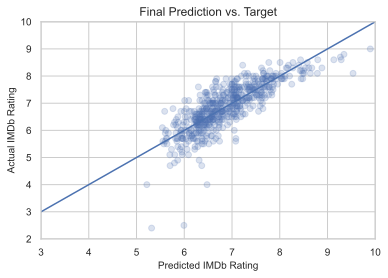

In [57]:
plt.scatter(model_pred, y_test, alpha=.2)
plt.plot(np.linspace(0,20), np.linspace(0,20))
plt.title('Final Prediction vs. Target',fontdict = {'fontsize' : 12})
plt.xlabel('Predicted IMDb Rating',fontdict = {'fontsize' : 10})
plt.ylabel('Actual IMDb Rating',fontdict = {'fontsize' : 10})
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.axis([3,10,2,10])
plt.show()

In [58]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))

    pred = x

    plt.subplot(1, 3, 1)
    plt.scatter(x,y, alpha=0.5)
    plt.plot(x, pred, color='blue',linewidth=1)
    plt.title("Regression fit")
    plt.xlabel("x")
    plt.ylabel("y")
    
    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res, alpha=0.5)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")
    
    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a specified theoretical distribution 
    stats.probplot(res, dist="norm", plot=plt)
    plt.title("Normal Q-Q plot");

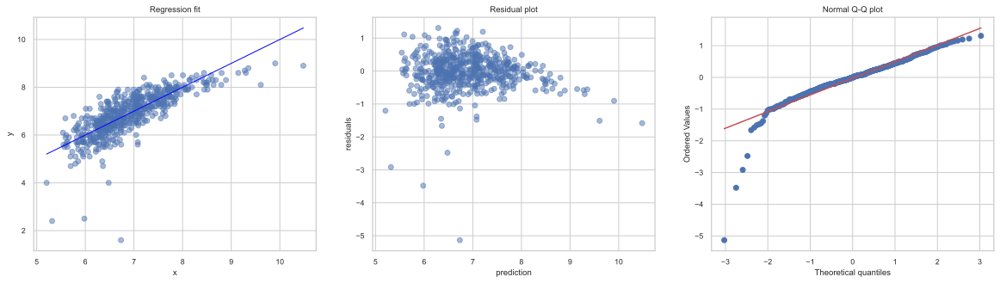

In [59]:
diagnostic_plot(test_set_pred, y_test)

### So what makes a movie successful on IMDB?

In [60]:
X, y = imdb_cp.iloc[:,5:], imdb_cp['IMDB Rating']

In [61]:
X_scaled = scaler.fit_transform(X)
X_predicted = lr_reg.predict(X_scaled)

In [62]:
imdb_cp['res'] = X_predicted - imdb_cp['IMDB Rating']

In [63]:
imdb_cp['res'].sort_values().head(20)


Title
Elite Squad                      -1.727201
I Am Sam                         -1.345284
Flipped                          -1.334707
Pink Floyd: The Wall             -1.286960
The Phantom of the Opera         -1.280097
Avengers: Infinity War           -1.247225
Love Me If You Dare              -1.225415
Falling Down                     -1.216964
The Boondock Saints              -1.215330
The Chorus                       -1.215110
Predator                         -1.197621
Highlander                       -1.180910
Half Baked                       -1.168346
The Lost Boys                    -1.167424
The Boy in the Striped Pajamas   -1.166861
Capharnaüm                       -1.138681
Like Stars on Earth              -1.138332
My Name Is Khan                  -1.135172
Christmas Vacation               -1.128546
The Life of David Gale           -1.114621
Name: res, dtype: float64

In [64]:
imdb_cp['res'].sort_values(ascending=False).head(20)

Title
Justin Bieber: Never Say Never    5.476384
Dragonball Evolution              3.542867
Disaster Movie                    3.301572
Epic Movie                        2.850709
Battlefield Earth                 2.690696
Fifty Shades of Grey              2.579118
Street Fighter                    2.495577
Catwoman                          2.332918
Jack and Jill                     2.331983
Meet the Spartans                 2.324571
Home Alone 3                      2.268118
The Room                          1.943993
Speed 2: Cruise Control           1.845892
Junior                            1.829352
Twilight                          1.751845
Knock Knock                       1.715146
Rocky V                           1.681845
Scary Movie V                     1.676288
Spring Breakers                   1.658165
The Twilight Saga: New Moon       1.637570
Name: res, dtype: float64

Take a look at the Justine Biber Movie! It was over predicted the most!

In [65]:
imdb_cp.drop(['res'],axis=1, inplace=True)

In [66]:
coef_zip = dict(zip(imdb_cp.iloc[:,6:].columns.tolist(), ridge_m.coef_))
coef_zip = sorted(coef_zip.items(), key=lambda item: item[1], reverse=True)

NameError: name 'ridge_m' is not defined

In [ ]:
sorted_coef = list(coef_zip)[:10]

In [ ]:
plot_name = [name[0].title() for name in sorted_coef]
plot_coef = [coef[1] for coef in sorted_coef]
colors = [0 if c>=0 else 1 for c in plot_coef]

In [ ]:
sns.set_theme(style="whitegrid")
cmap = sns.diverging_palette(240, 10, n=2)
movie_coef = sns.barplot(
    y=plot_name,
    x=plot_coef,
    hue=colors,
    palette=cmap,
    orient='h',
    )
movie_coef.set_title('Top 10 Features for IMDb Rating',fontsize=15,y=1.05, x=0.31)
movie_coef.get_legend().set_visible(False)
movie_coef.set_xlabel('Coefficient',fontsize=10)
movie_coef.set_ylabel('Feature',fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()
fig = movie_coef.get_figure()